## Lab 1.2 - Visualize Real Estate Data in St. Petersburg
We have data from Yandex.Realty classified https://realty.yandex.ru containing real estate listings for apartments in St. Petersburg and Leningrad Oblast from 2016 till the middle of August 2018. 

### Main objectives
After successful completion of the lab work students will be able to:
-   Analyze datasets with visualization techniques


### 1. Load data with real estate prices

In [1]:
!pip install -q https://github.com/pandas-profiling/pandas-profiling/archive/master.zip;

In [2]:
from pandas_profiling import ProfileReport

/opt/conda/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/tmp/ipykernel_754/2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
# let's import pandas library and set options to be able to view data right in the browser
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import matplotlib.style as style
from matplotlib import pyplot as plt
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', 1000)
style.use('fivethirtyeight')


In [4]:
# import math library which we'll need later for calculating metrics
import math
from sklearn.metrics import mean_squared_error

In [5]:
# load our dataset and see which data it contains.
#spb_df = pd.read_table('/home/jovyan/__DATA/E2ESML_Spring2022/data/spb.real.estate.archive.2018.tsv')
spb_df = pd.read_table('data/spb.real.estate.archive.2018.tsv')

In [6]:
# let's look at random sample of the loaded dataset to understand what's inside
spb_df.sample(5)

,offer_id,first_day_exposition,last_day_exposition,last_price,floor,open_plan,rooms,studio,area,kitchen_area,living_area,agent_fee,renovation,offer_type,category_type,unified_address,building_id
305541,3331425831309490688,2018-03-09T00:00:00+03:00,2018-07-15T00:00:00+03:00,2150000.0,4,False,0,True,28.00,NaN,17.16,NaN,2.0,1,2,"Россия, Ленинградская область, Всеволожский район, посёлок Мурино, Петровский бульвар, 12к2",8574123471881618288
93979,5660553206700063667,2016-09-29T00:00:00+03:00,2016-10-06T00:00:00+03:00,1940000.0,5,False,1,False,20.62,NaN,14.69,NaN,0.0,1,2,"Россия, Ленинградская область, Всеволожский район, Заневское городское поселение, деревня Кудрово, Европейский проспект, 3",1834942744636030495
398846,3780681396490563328,2018-07-13T00:00:00+03:00,2018-08-03T00:00:00+03:00,16000.0,2,False,2,False,43.00,NaN,NaN,50.0,NaN,2,2,"Россия, Санкт-Петербург, Пушкин, бульвар Алексея Толстого, 7",3598590869555031941
377765,5565310413830657287,2018-06-19T00:00:00+03:00,2018-06-26T00:00:00+03:00,80000.0,5,False,0,True,111.00,NaN,NaN,100.0,NaN,2,2,"Россия, Санкт-Петербург, Гаванская улица, 10",4518918858627107001
71702,1583202797297375079,2016-06-24T00:00:00+03:00,2016-06-30T00:00:00+03:00,21000.0,3,False,1,False,32.50,10.0,15.00,NaN,0.0,2,2,"Россия, Санкт-Петербург, Индустриальный проспект, 28",8547789847925605461


In [7]:
# let's check how much data to we have
len(spb_df)

429187

### 2. Prepare cleaned dataset with RENT data in St.Peterburg without Oblast 
<p>Use results of our analysis of the previous Lab Works for cleaning the dataset
<p>Reminder: offer_type column contains data to distinct rent from sell items, 2 stands for RENT, 1 for SELL


#### Prepare dataframe with rent data in city limits

In [8]:
rent_df = spb_df[spb_df.offer_type == 2].copy()
print("Total rent data size: {}".format(len(rent_df)))
rent_df_spb = rent_df[rent_df.unified_address.str.contains('Россия, Санкт-Петербург').copy()]
print("Rent data size in city limits: {}".format(len(rent_df_spb)))

Total rent data size: 171186
Rent data size in city limits: 156054


#### Calculate price per square meter, get median prices for house and find outliers with the help of this

In [9]:
# calculate price per sq m
rent_df_spb['price_per_sq_m'] = rent_df_spb.last_price/rent_df.area

/tmp/ipykernel_754/2421221933.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rent_df_spb['price_per_sq_m'] = rent_df_spb.last_price/rent_df.area


##### Find median price per sq m per house

In [10]:
house_rent_df = rent_df_spb.groupby('unified_address').price_per_sq_m.median().reset_index()

In [11]:
house_rent_df.rename(columns = {'price_per_sq_m': 'house_price_sqm_median'}, inplace = True)

##### Merge rent data with house median prices and inspect outliers

In [12]:
rent_df_spb = rent_df_spb.merge(house_rent_df)

##### Clean data from the outliers - use results from Lab 1

In [13]:
rent_df_cleaned = rent_df_spb[~((rent_df_spb.price_per_sq_m/rent_df_spb.house_price_sqm_median) > 5)]
rent_df_cleaned = rent_df_cleaned[rent_df_cleaned.last_price < 1000000]
rent_df_cleaned = rent_df_cleaned[~((rent_df_cleaned.price_per_sq_m > 3000) 
                                     & ((rent_df_cleaned.house_price_sqm_median < 1000) 
                                        | (rent_df_cleaned.house_price_sqm_median == rent_df_cleaned.price_per_sq_m)))]
rent_df_cleaned = rent_df_cleaned[~((rent_df_cleaned.price_per_sq_m < 250) 
                               & (rent_df_cleaned.house_price_sqm_median/rent_df_cleaned.price_per_sq_m >= 2))]
rent_df_cleaned = rent_df_cleaned[~((rent_df_cleaned.price_per_sq_m < 200) 
                                          & (rent_df_cleaned.price_per_sq_m == rent_df_cleaned.house_price_sqm_median))]

#### Visualize 'last_price feature with box plot and violin plot. Explore box plot and clean data following statistical rules and interquartile range

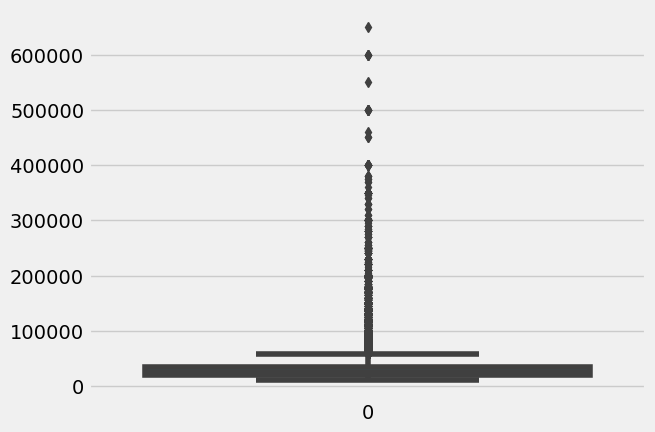

In [14]:
sns.boxplot(rent_df_cleaned['last_price']);

In [15]:
def visualization(df, feature):
    fig, axs = plt.subplots(3, figsize = (8, 5))
    # Histogram plot
    axs[0].set_title('Histogram')
    df[feature].hist(ax = axs[0])

    # QQ plot
    axs[1].set_title('QQ')
    stats.probplot(df[feature], plot = axs[1])
    
    # Box plot
    axs[2].set_title('Box plot')
    sns.boxplot(df[feature], ax = axs[2], orient = 'h')
    print("Skewness: %f" % df[feature].skew())
    print("Kurtosis: %f" % df[feature].kurt())

Skewness: 5.188733
Kurtosis: 50.765068


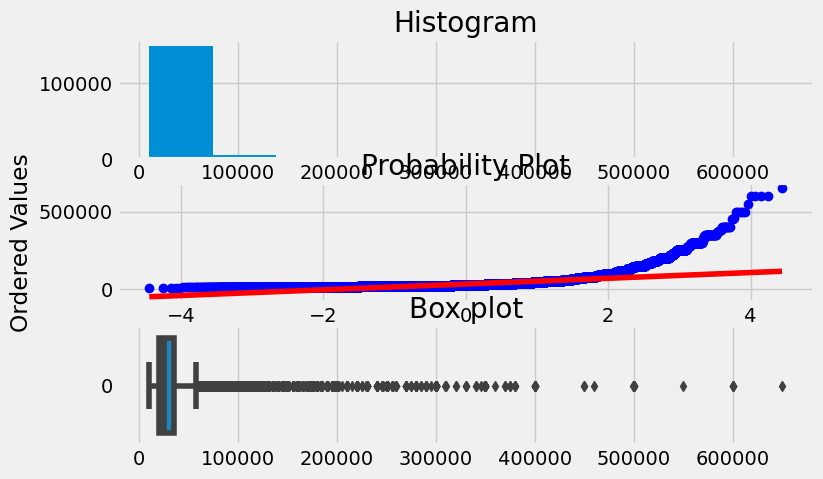

In [16]:
visualization(rent_df_cleaned, 'last_price')

In [17]:
rent_df_cleaned['last_price'].quantile(0.997)

200000.0

In [18]:
rent_df_cleaned = rent_df_cleaned[rent_df_cleaned['last_price'] < 200000]

In [19]:
rent_df_cleaned.shape

(155392, 19)

Skewness: 3.078190
Kurtosis: 12.995784


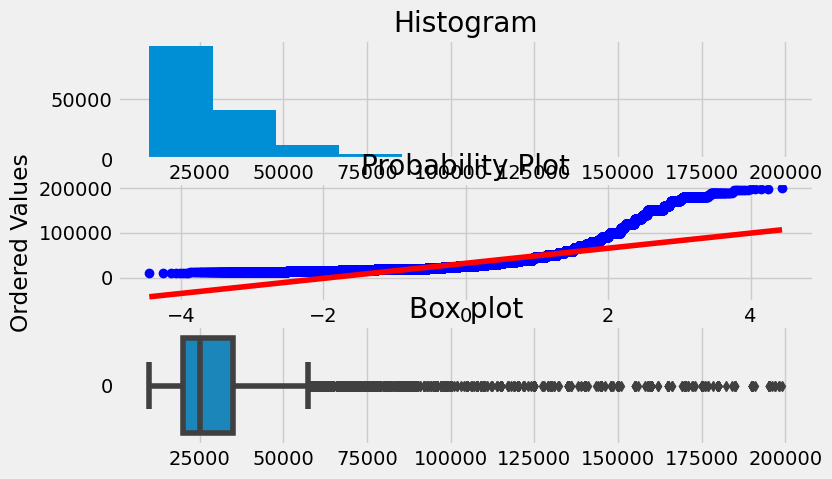

In [20]:
visualization(rent_df_cleaned, 'last_price')

As we see, the target variable last_price is not normally distributed.
This can reduce the performance of the ML regression models because some assume normal distribution,
see sklearn info on preprocessing
Therfore we make a log transformation, the resulting distribution looks much better.

### Explore features, which of them are binary, which quantitative, qualitative. 

In [21]:
rent_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 155392 entries, 0 to 156053
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   offer_id                155392 non-null  int64  
 1   first_day_exposition    155392 non-null  object 
 2   last_day_exposition     155392 non-null  object 
 3   last_price              155392 non-null  float64
 4   floor                   155392 non-null  int64  
 5   open_plan               155392 non-null  bool   
 6   rooms                   155392 non-null  int64  
 7   studio                  155392 non-null  bool   
 8   area                    155392 non-null  float64
 9   kitchen_area            118364 non-null  float64
 10  living_area             123015 non-null  float64
 11  agent_fee               122840 non-null  float64
 12  renovation              102677 non-null  float64
 13  offer_type              155392 non-null  int64  
 14  category_type           1

In [22]:
# Binary
binary = [f for f in rent_df_cleaned.columns if rent_df_cleaned.dtypes[f] == 'bool']
print("Binary variables: {}".format(binary))
# Quantitative
quantitative = [f for f in rent_df_cleaned.columns if rent_df_cleaned.dtypes[f] != 'object']
for f in binary:
    quantitative.remove(f)
print("Quantitative variables: {}".format(quantitative))
# Qualitative
qualitative = [f for f in rent_df_cleaned.columns if rent_df_cleaned.dtypes[f] == 'object']
print("Qualitative variables: {}".format(qualitative))

Binary variables: ['open_plan', 'studio']
Quantitative variables: ['offer_id', 'last_price', 'floor', 'rooms', 'area', 'kitchen_area', 'living_area', 'agent_fee', 'renovation', 'offer_type', 'category_type', 'building_id', 'price_per_sq_m', 'house_price_sqm_median']
Qualitative variables: ['first_day_exposition', 'last_day_exposition', 'unified_address']


In [23]:
profile = ProfileReport(rent_df_cleaned, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Find missing values fill them as you want. 

In [24]:
# Find missing
rent_df_cleaned.isna().mean() * 100

offer_id                   0.000000
first_day_exposition       0.000000
last_day_exposition        0.000000
last_price                 0.000000
floor                      0.000000
open_plan                  0.000000
rooms                      0.000000
studio                     0.000000
area                       0.000000
kitchen_area              23.828769
living_area               20.835693
agent_fee                 20.948311
renovation                33.923883
offer_type                 0.000000
category_type              0.000000
unified_address            0.000000
building_id                0.000000
price_per_sq_m             0.000000
house_price_sqm_median     0.000000
dtype: float64

In [25]:
rent_df_cleaned.describe()

,offer_id,last_price,floor,rooms,area,kitchen_area,living_area,agent_fee,renovation,offer_type,category_type,building_id,price_per_sq_m,house_price_sqm_median
count,1.553920e+05,155392.000000,155392.000000,155392.000000,155392.000000,118364.000000,123015.000000,122840.000000,102677.000000,155392.0,155392.0,1.553920e+05,155392.000000,155392.000000
mean,4.676946e+18,31889.961349,6.698498,1.599297,53.358246,11.597837,30.419019,71.925965,3.696592,2.0,2.0,4.566682e+18,597.477205,588.553785
std,2.636321e+18,20303.545282,4.978305,0.872410,24.097810,82.238109,17.405261,28.424895,4.489441,0.0,0.0,2.696169e+18,195.955071,151.965058
min,8.726400e+05,9990.000000,1.000000,0.000000,11.000000,2.000000,2.000000,0.000000,0.000000,2.0,2.0,4.585730e+14,154.929577,183.098592
25%,2.683554e+18,20000.000000,3.000000,1.000000,38.000000,8.000000,18.000000,50.000000,0.000000,2.0,2.0,2.153540e+18,468.750000,500.000000
50%,5.141797e+18,25000.000000,5.000000,1.000000,46.000000,10.000000,27.000000,70.000000,1.000000,2.0,2.0,4.697630e+18,555.555556,552.631579
75%,6.838787e+18,35000.000000,9.000000,2.000000,62.000000,12.000000,37.000000,100.000000,10.000000,2.0,2.0,6.829723e+18,674.157303,640.625000
max,9.223288e+18,199000.000000,92.000000,5.000000,200.000000,25000.000000,2015.000000,100.000000,11.000000,2.0,2.0,9.220297e+18,2608.695652,2467.532468


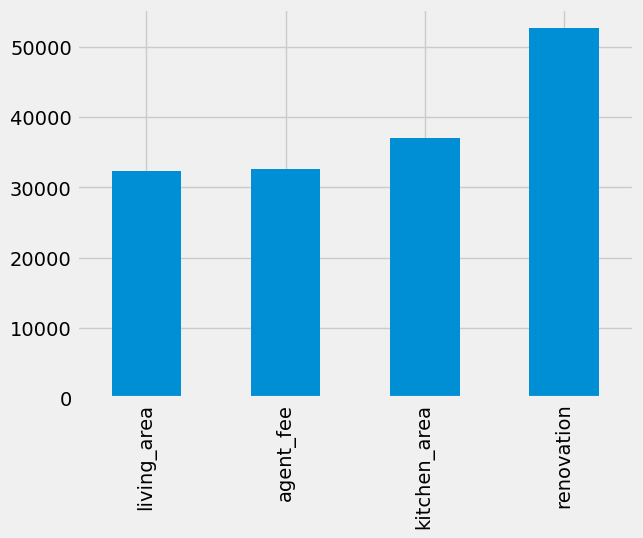

In [26]:
missing = rent_df_cleaned.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace = True)
missing.plot.bar();

In [27]:
rent_df_cleaned['offer_type'].value_counts()

offer_type
2    155392
Name: count, dtype: int64

In [28]:
rent_df_cleaned['category_type'].value_counts()

category_type
2    155392
Name: count, dtype: int64

In [29]:
rent_df_cleaned['living_area'] = rent_df_cleaned['living_area'].fillna(rent_df_cleaned['living_area'].median())
rent_df_cleaned['kitchen_area'] = rent_df_cleaned['kitchen_area'].fillna(rent_df_cleaned['kitchen_area'].median())

In [30]:
rent_df_cleaned['renovation'] = rent_df_cleaned['renovation'].fillna(0.0)

In [31]:
rent_df_cleaned.isna().mean() * 100

offer_id                   0.000000
first_day_exposition       0.000000
last_day_exposition        0.000000
last_price                 0.000000
floor                      0.000000
open_plan                  0.000000
rooms                      0.000000
studio                     0.000000
area                       0.000000
kitchen_area               0.000000
living_area                0.000000
agent_fee                 20.948311
renovation                 0.000000
offer_type                 0.000000
category_type              0.000000
unified_address            0.000000
building_id                0.000000
price_per_sq_m             0.000000
house_price_sqm_median     0.000000
dtype: float64

### Drop useless columns

In [32]:
rent_df_cleaned.drop(columns = ['first_day_exposition', 'last_day_exposition', 'offer_type', 'category_type', 'agent_fee'], inplace = True)

In [33]:
rent_df_cleaned.head()

,offer_id,last_price,floor,open_plan,rooms,studio,area,kitchen_area,living_area,renovation,unified_address,building_id,price_per_sq_m,house_price_sqm_median
0,1100202,20000.0,7,False,1,False,28.0,8.0,20.0,3.0,"Россия, Санкт-Петербург, Богатырский проспект, 5к1",6719200042030752141,714.285714,512.820513
1,5028522699704970725,40000.0,4,False,2,False,72.0,10.0,44.0,0.0,"Россия, Санкт-Петербург, набережная реки Фонтанки, 66",3406104650917898355,555.555556,675.675676
2,5028522699709767236,45000.0,2,False,2,False,55.0,10.0,33.0,0.0,"Россия, Санкт-Петербург, Большой проспект П.С., 102",2357095685903407888,818.181818,818.181818
3,1100874,21000.0,5,False,1,False,35.0,8.0,18.0,11.0,"Россия, Санкт-Петербург, Лужская улица, 8",5887402119500981764,600.000000,568.468556
4,875413,25000.0,10,False,1,True,44.0,15.0,18.0,10.0,"Россия, Санкт-Петербург, Учительская улица, 3",6527910144166454997,568.181818,625.000000


### Explore relations between different features. Build correlation heatmap

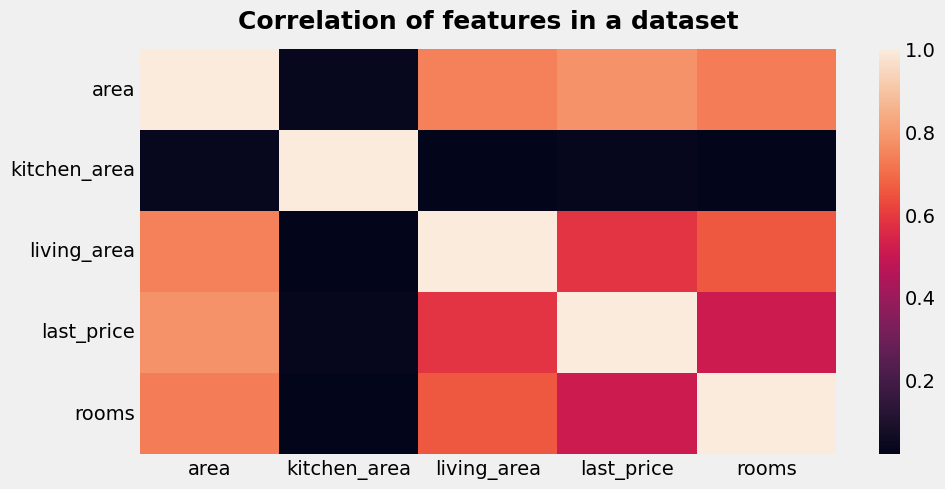

In [34]:
plt.figure(figsize = (10, 5)) 
sns.heatmap(rent_df_cleaned[['area', 'kitchen_area', 'living_area', 'last_price', 'rooms']].corr())
plt.title('Correlation of features in a dataset', fontweight = "bold", fontsize = 18, pad = 15)
plt.show()

In [35]:
categorical = ['floor', 'open_plan', 'rooms', 'renovation', 'studio']

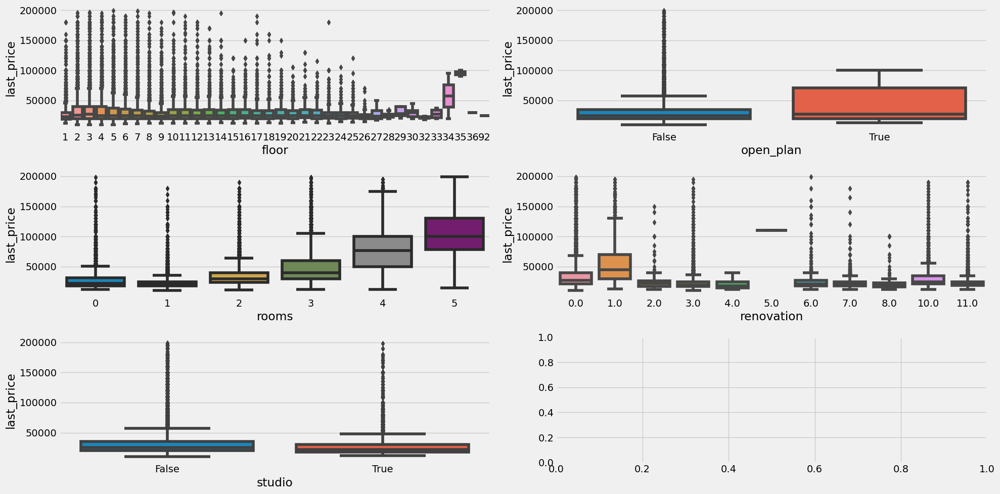

In [36]:
fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize = (20, 10))
for idx, feat in enumerate(categorical):
    ax = axes[int(idx/2), idx%2]
    sns.boxplot(x = feat, y = 'last_price', data = rent_df_cleaned, ax = ax)
    ax.set_xlabel(feat)
fig.tight_layout()

In [37]:
rent_df_cleaned['open_plan'] = rent_df_cleaned['open_plan'].astype('int')
rent_df_cleaned['studio'] = rent_df_cleaned['studio'].astype('int')

In [38]:
rent_df_cleaned.head()

,offer_id,last_price,floor,open_plan,rooms,studio,area,kitchen_area,living_area,renovation,unified_address,building_id,price_per_sq_m,house_price_sqm_median
0,1100202,20000.0,7,0,1,0,28.0,8.0,20.0,3.0,"Россия, Санкт-Петербург, Богатырский проспект, 5к1",6719200042030752141,714.285714,512.820513
1,5028522699704970725,40000.0,4,0,2,0,72.0,10.0,44.0,0.0,"Россия, Санкт-Петербург, набережная реки Фонтанки, 66",3406104650917898355,555.555556,675.675676
2,5028522699709767236,45000.0,2,0,2,0,55.0,10.0,33.0,0.0,"Россия, Санкт-Петербург, Большой проспект П.С., 102",2357095685903407888,818.181818,818.181818
3,1100874,21000.0,5,0,1,0,35.0,8.0,18.0,11.0,"Россия, Санкт-Петербург, Лужская улица, 8",5887402119500981764,600.000000,568.468556
4,875413,25000.0,10,0,1,1,44.0,15.0,18.0,10.0,"Россия, Санкт-Петербург, Учительская улица, 3",6527910144166454997,568.181818,625.000000


#### Save cleaned dataset to new csv.

In [39]:
rent_df_cleaned.to_csv('cleaned_dataset.csv', index = False)

### Self-control stops
1. How do You think which feature is most important in predicting price. 
2. What other factors might influence price? Think of the factors which can be actually calculated and included in the model. Maybe from some external sources? 

**How do You think which feature is most important in predicting price.**  
The following factors have the greatest influence on price forecasting: rooms, area, living_area, price_per_sq_m, house_price_sqm_median.  
The correlation between last price and other listed factors is more than 50%.

**What other factors might influence price? Think of the factors which can be actually calculated and included in the model. Maybe from some external sources?**  
Also, the price of an apartment can also be affected by the following factors: availability of parking spaces, distance to the park/metro/airport/school, sunny or non-sunny side, presence of a closed and guarded area.